# Library

In [1]:
import pandas as pd
import numpy as np
from bertopic import BERTopic
import sys
sys.path.append('../../../Util')
import ShowGraphs as sg

c:\Users\dommy\miniconda3\envs\gestione\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 7 Baseline Summary Content

### Clustering Approach

- **Parameter Setting**:
  - Embedding Model: all-MiniLM-L6-v2
  - Representation Model: keyBERTInspired, MaximalMarginalRelevance
  - Count Vectorizer
  - CtfIDF
  - UMAP: 150 neighbors, 10 components
  - HDBSCAN: 500 min cluster size
  - Zero-Shot Classification on cluster name
  - Outliers-reduction with Probabilites: 0.092 threshold

### Clustering Results

- **Clusters Retrieved**: 26 in which the most important ones concern:
  1. Social Media Hacking
  2. Spotify account
  3. Only Fans
  4. Discord accounts
  5. Netflix accounts
  6. Data leak

- **Performance Metrics**:
  - **Silhouette Score**: 0.62
  - **Davies-Bouldin Score**: 0.48
  - **Coherence-Score**: 0.51
  - **Dos Score**: 0.2
  - **%Outliers**: 0.38 (36k/94k)

# Code

In order to avoid importing the whole **BERTopicUtils.py** module, and thus the linked libraries, I have only brought back the function needed to make predictions, it is the same as in the module

In [2]:
def predict_topic(topic_model: BERTopic, sentence: list, num_classes: int = 5, custom_labels: bool = False) -> pd.DataFrame:
    """
    Predict the topic of a sentence using the BERTopic model.
    :param topic_model: The BERTopic model.
    :param sentence: The sentence to predict the topic of.
    :param num_classes: The number of classes to return.
    :param custom_labels: Whether to use custom labels.
    :return: A DataFrame with the predicted topics.
    """
    # Transform the sentence
    _, pr = topic_model.transform(sentence)

    # Get the top indices
    top_indices = np.argsort(pr[0])[::-1][:num_classes]

    # Get the top topics
    if custom_labels:
        top_topics = [(topic_model.get_topic(i), pr[0][i], topic_model.custom_labels_[i+1]) for i in top_indices]
    else:
        top_topics = [(topic_model.get_topic(i), pr[0][i], topic_model.generate_topic_labels()[i+1]) for i in top_indices]
    
    # Create a DataFrame with the results
    df_finals = pd.DataFrame(top_topics, columns=['Topic', 'Probability', 'Label'])

    # Extract the words and sentence
    df_finals['Words'] = df_finals['Topic'].apply(lambda topic: [word for word, _ in topic])

    df_finals['Sentence'] = sentence * len(df_finals)
    
    return df_finals

# Visualize CSV Files

In [3]:
topic_model = BERTopic.load("../../../Analyze_files/CombiningAnalysisCompleteDataset/ThreadAnalysis/Models/topic_model_all-MiniLM-L6-v2_500_150n_10dim_raid")

In [17]:
descr_topic = pd.read_csv('CSV26TopicRaid/description_topic.csv')
document_topic = pd.read_csv('CSV26TopicRaid/document_topic_proba.csv')
topics_over_time = pd.read_csv('CSV26TopicRaid/topic_over_time_3.csv')

## Topic Description

In [18]:
print(descr_topic.shape[0])
descr_topic.head()

26


,Topic,Count,BERTopic_Name,Representation,Representative_Docs,Custom_Name_GenAI
0,13,1017,13_vpn_nordvpn_nord_accounts,['vpn' 'nordvpn' 'nord' 'accounts' 'nord vpn' ...,['NordVpn Premium Account x With Capture'\n 'N...,NordVPN Premium Accounts
1,0,7773,0_database_data_db_databases,['database' 'data' 'db' 'databases' 'dump' 'us...,['FREE india insurance company policy informat...,Data Collection
2,15,1260,15_twitch_youtube_streamer_stream,['twitch' 'youtube' 'streamer' 'stream' 'raid'...,['Autistic Twitch Stream Raid' 'twitch stream ...,Twitch Raid Streams
3,10,2056,10_raid_raidforums_server_raiding,['raid' 'raidforums' 'server' 'raiding' 'raid ...,['It raid broski' 'LUL RAID THIS' 'Please raid...,Server Raids
4,19,881,19_discord_discord server_server_tokens,['discord' 'discord server' 'server' 'tokens' ...,['Discord server' 'Discord discord'\n 'DISCORD...,Discord Server Tokens


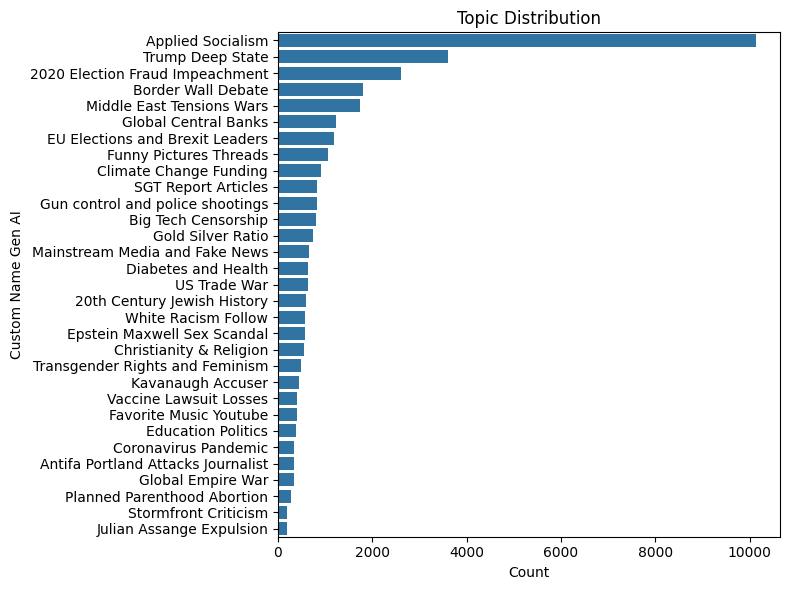

In [5]:
sg.plot_topic_distribution(descr_topic)

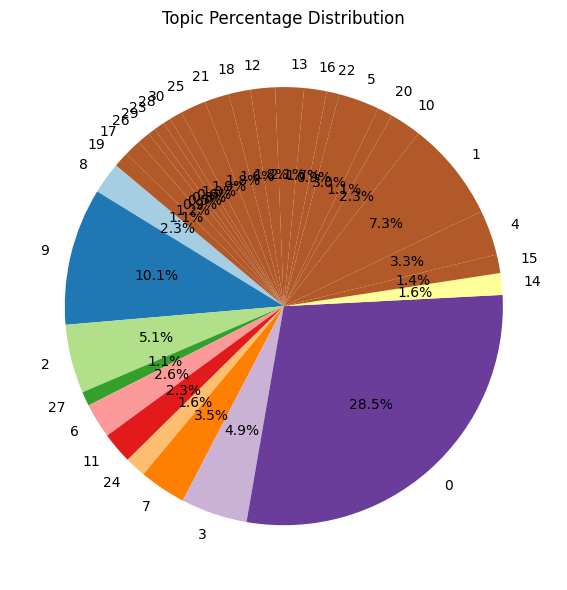

In [6]:
sg.plot_topic_percentage_distribution(descr_topic)

In [ ]:
sg.create_wordclouds(topic_model, num_topics=31, cols=3, width=800, height=600)

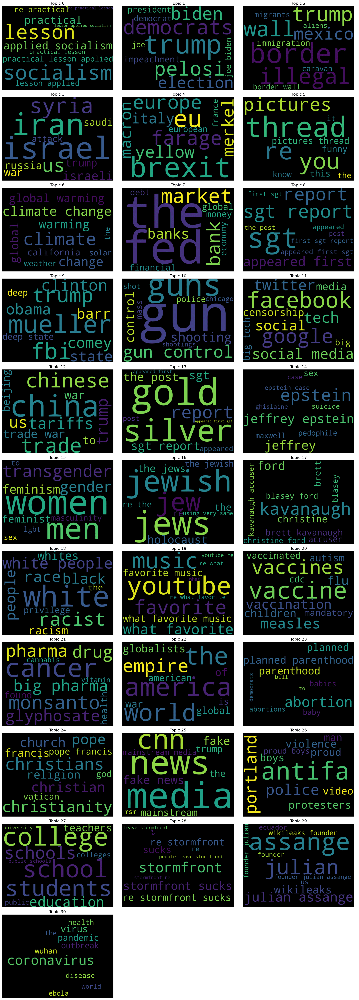

## Document Topic Description

In [19]:
print(document_topic.shape[0])
document_topic.head(5)

58088


,Document,Topic,Probability,Created_on,BERTopic_Name
0,NORDVPN EMAIL PASSWORD,13,[0.00529011 0.00634215 0.00576104 0.00632063 0...,2021-12-16,13_vpn_nordvpn_nord_accounts
1,Multiple private DBs sale,0,[0.15163479 0.02341947 0.01535352 0.03209005 0...,2021-12-16,0_database_data_db_databases
2,Twitch Experiances,15,[2.36766448e-308 3.25020176e-308 4.82940605e-3...,2021-12-16,15_twitch_youtube_streamer_stream
3,Hello Raidforum,10,[0.01228827 0.01569647 0.01971472 0.01083042 0...,2021-12-16,10_raid_raidforums_server_raiding
4,Discord Server Neo Nazi diaper fetish,19,[0.00604313 0.00844743 0.0093405 0.0055302 0...,2021-12-16,19_discord_discord server_server_tokens


In [13]:
result_df = sg.extract_max_probabilities(document_topic)

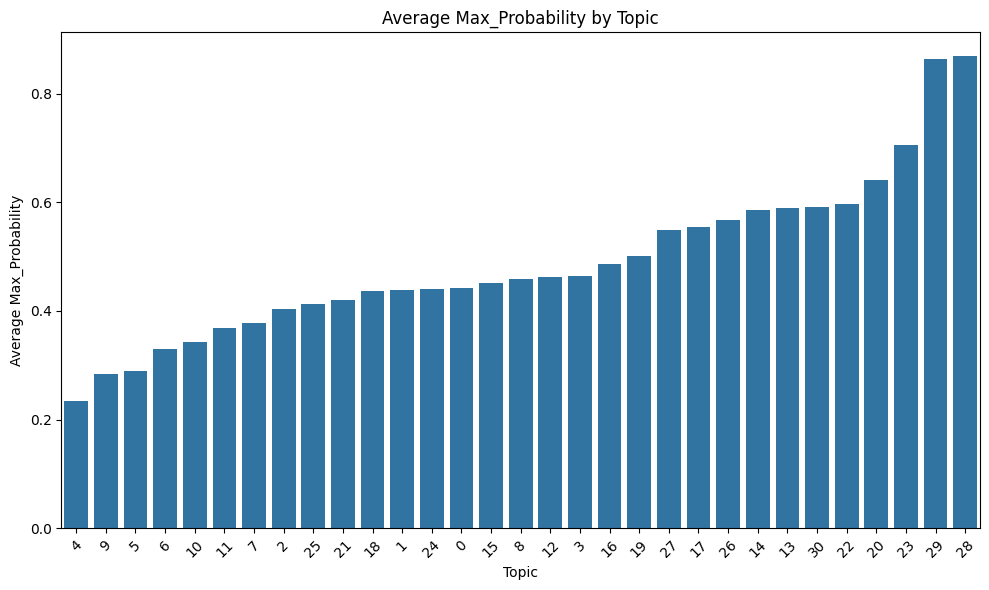

In [17]:
sg.plot_avg_prob_or_freq(result_df, 'Max_Probability', figsize=(10, 6))

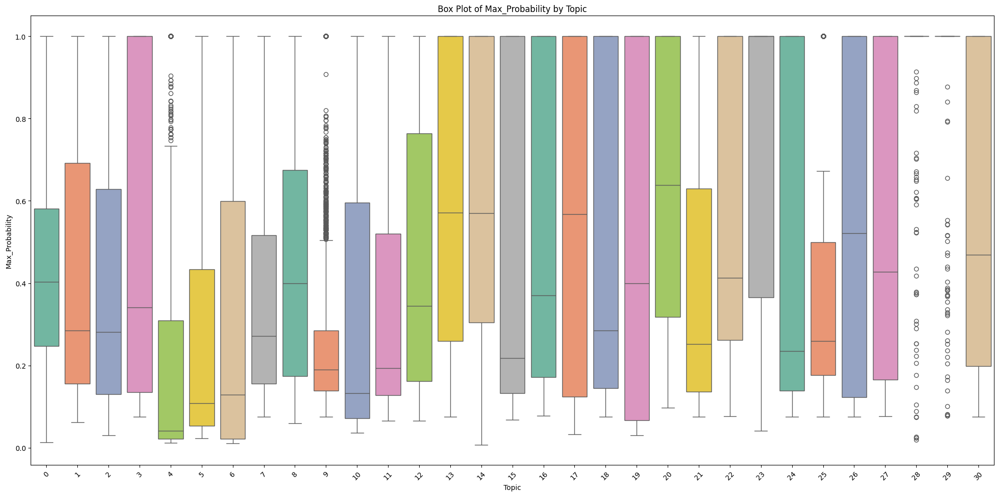

In [18]:
sg.plot_boxplot(result_df, 'Max_Probability', figsize=(20, 10))

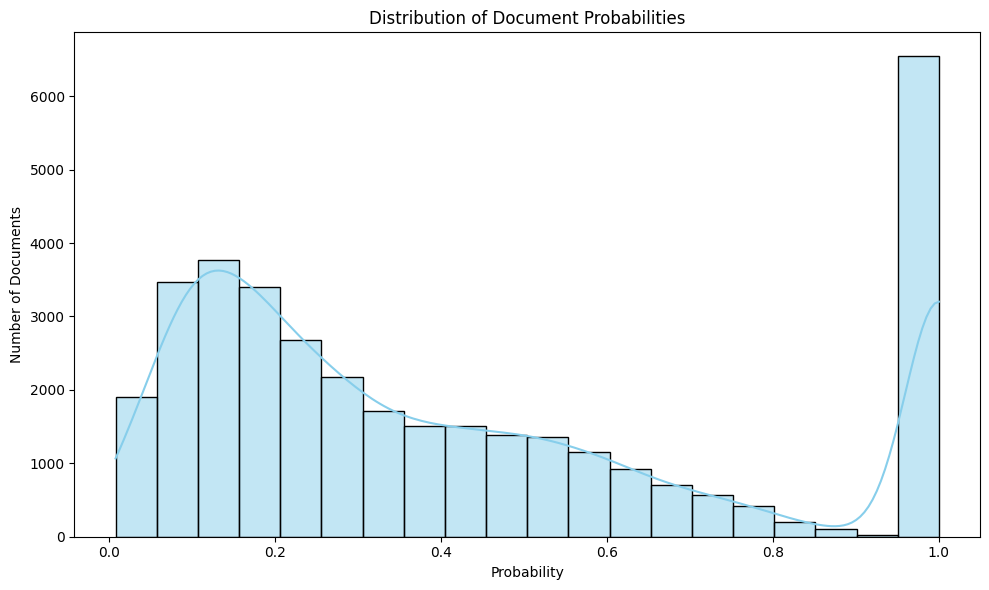

In [19]:
sg.plot_probability_distribution(result_df, 'Max_Probability')

In [ ]:
sg.create_wordclouds(document_topic, num_topics=31, cols=3, is_model=False, width=1000, height=600)

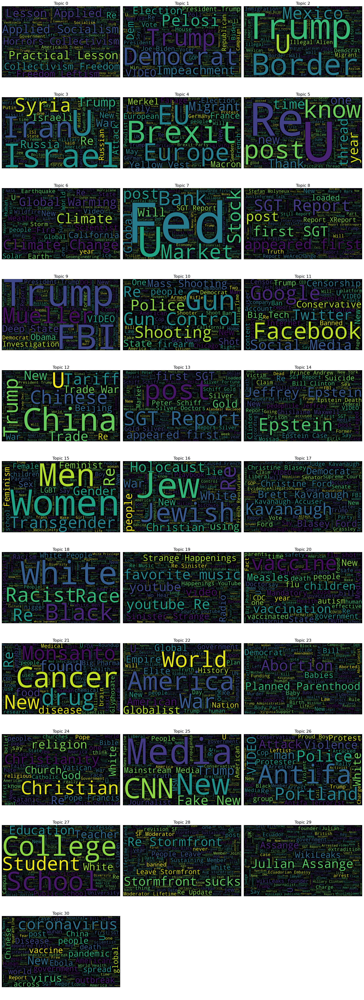

In [ ]:
sg.create_topic_network_graphs(document_topic, max_words=50, min_occurrences=10, cols=2, window_size=10)

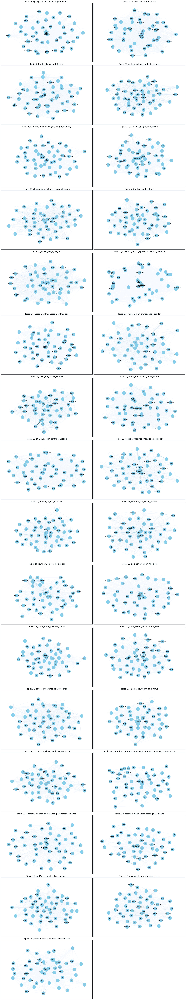

## Topics Over Time

In [6]:
print(topics_over_time.shape[0])
topics_over_time.head(5)

259


,Topic,Words,Frequency,Timestamp,BERTopic_Name
0,0,"socialism, collectivism, applied socialism, le...",161,2013-05-04 04:06:14.400,Applied Socialism
1,0,"socialism, freedom, applied socialism, lesson ...",27,2014-02-13 21:36:00.000,Applied Socialism
2,0,"socialism, freedom, applied socialism, practic...",60,2014-11-23 19:12:00.000,Applied Socialism
3,0,"socialism, applied socialism, practical lesson...",9,2015-09-02 16:48:00.000,Applied Socialism
4,0,"freedom, socialism, applied socialism, practic...",5,2016-06-11 14:24:00.000,Applied Socialism


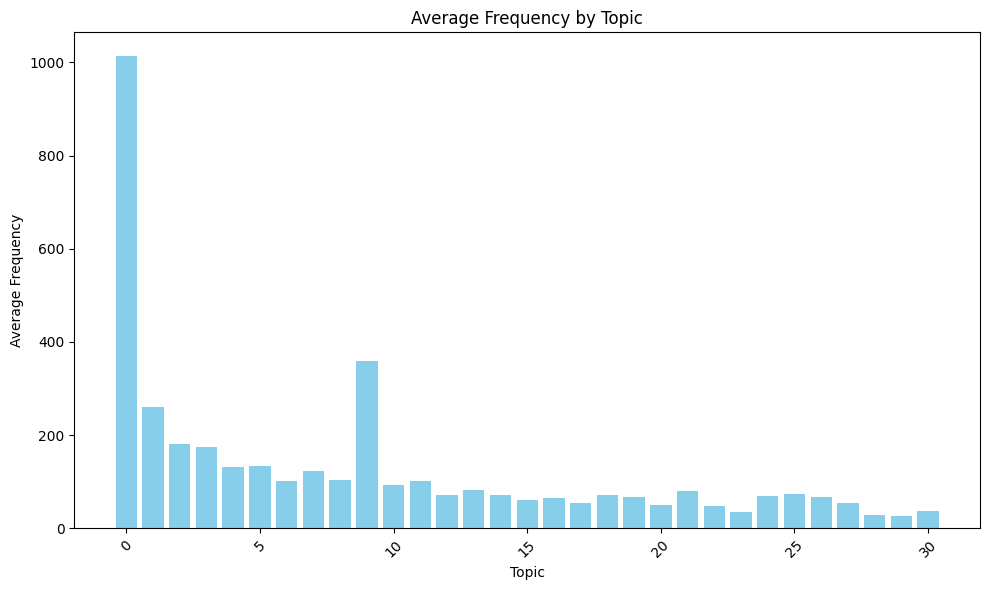

In [24]:
sg.plot_avg_prob_or_freq(topics_over_time, 'Frequency', figsize=(10, 6))

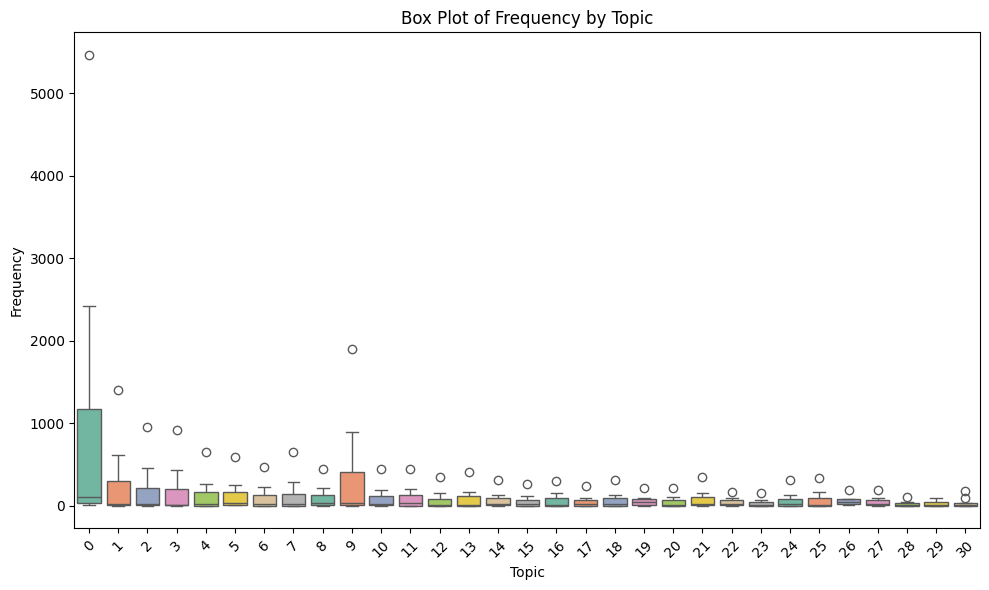

In [26]:
sg.plot_boxplot(topics_over_time, 'Frequency', figsize=(10, 6))

# Visualize Graphs

In [7]:
topic_model = BERTopic.load("../../Analyze_files/CombiningAnalysisCompleteDataset/ContentAnalysis/ModelsContent/topic_model_all-MiniLM-L6-v2_150_150n_10dim_white_nation", embedding_model='all-MiniLM-L6-v2')

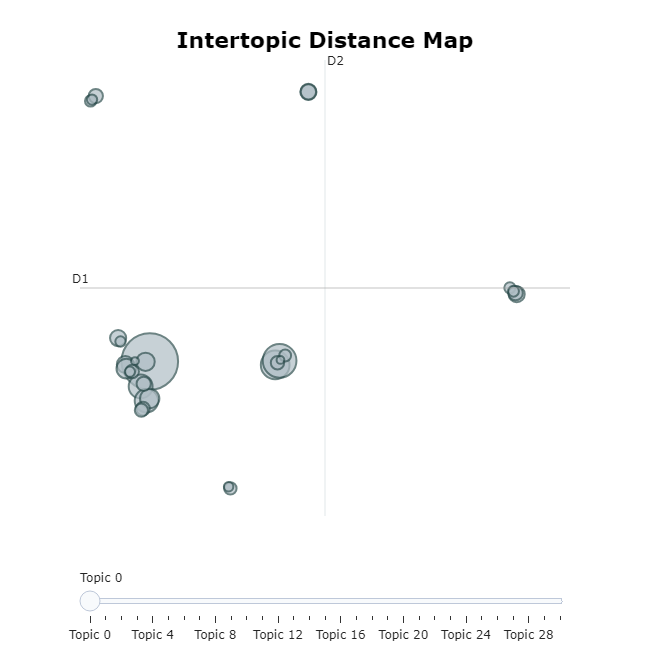
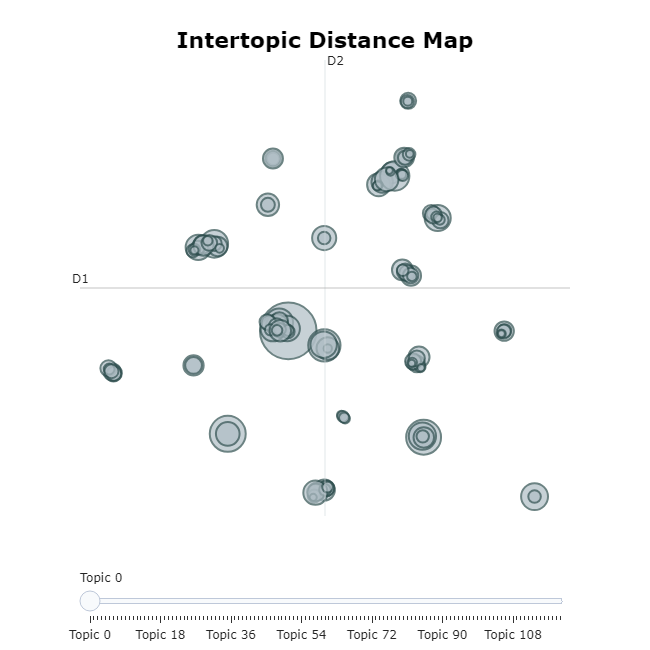

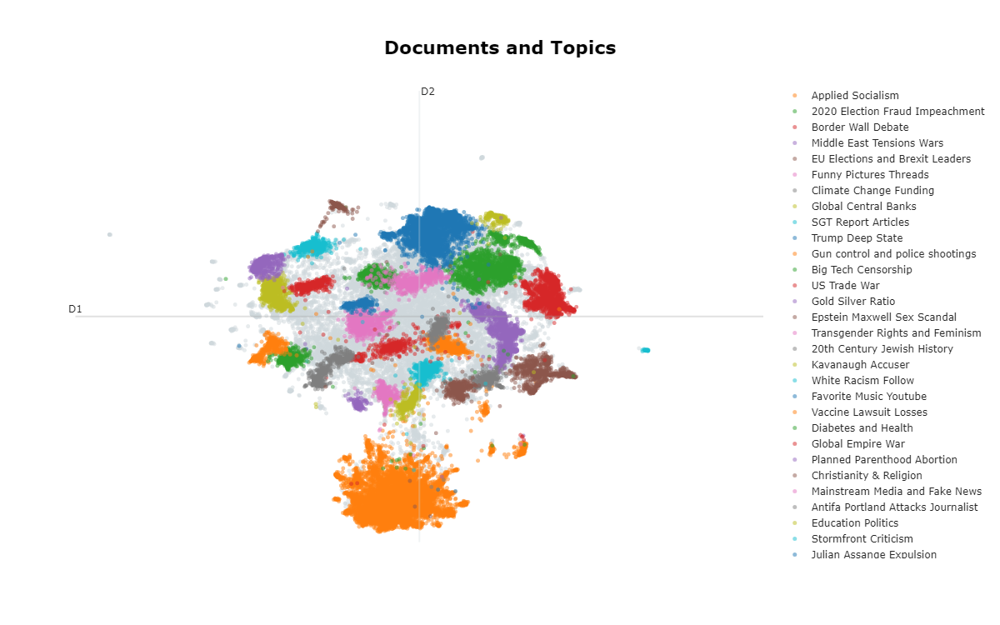
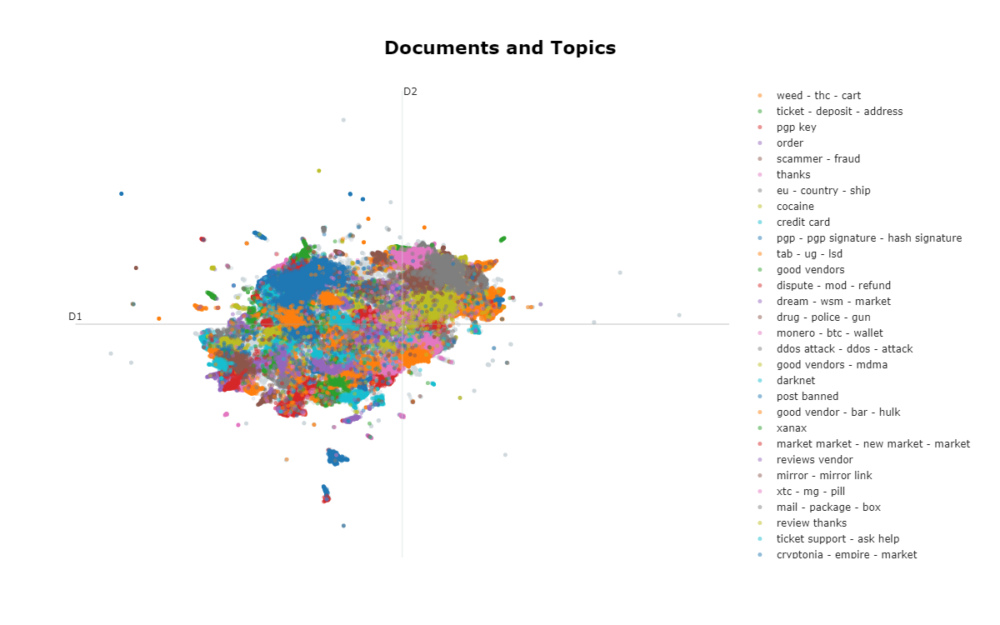
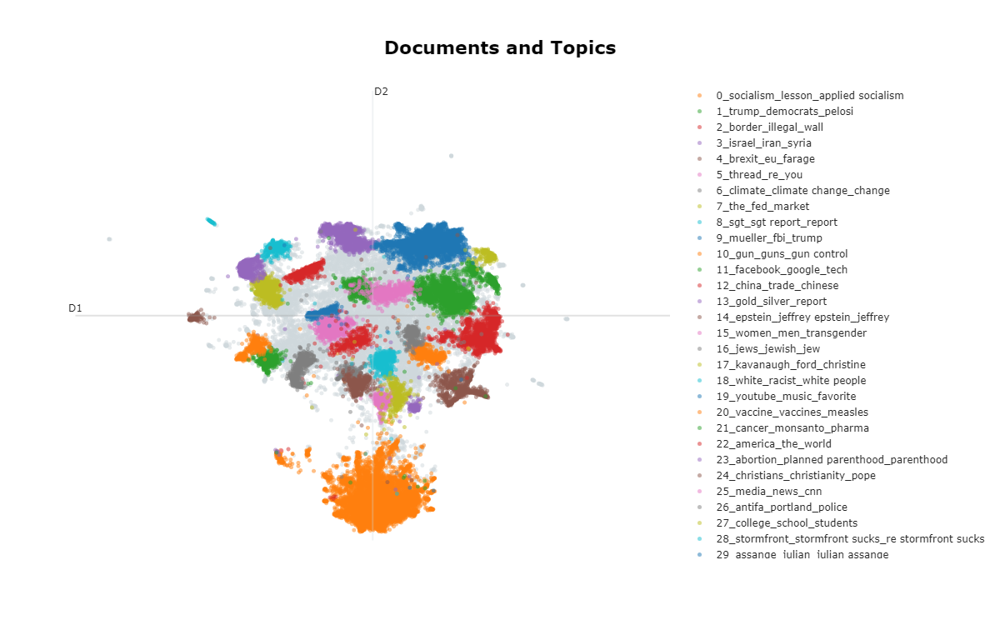

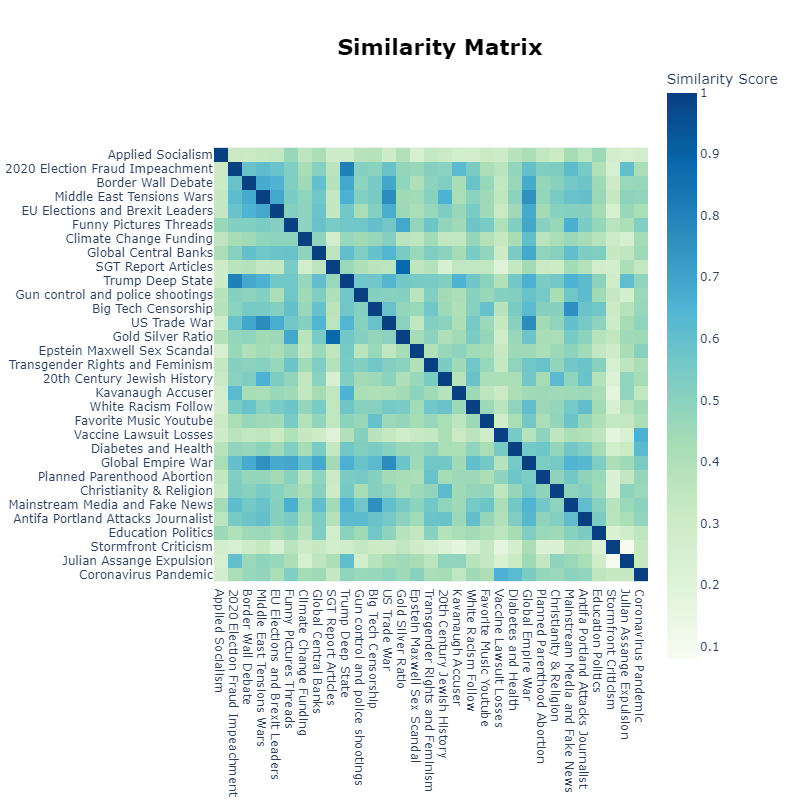
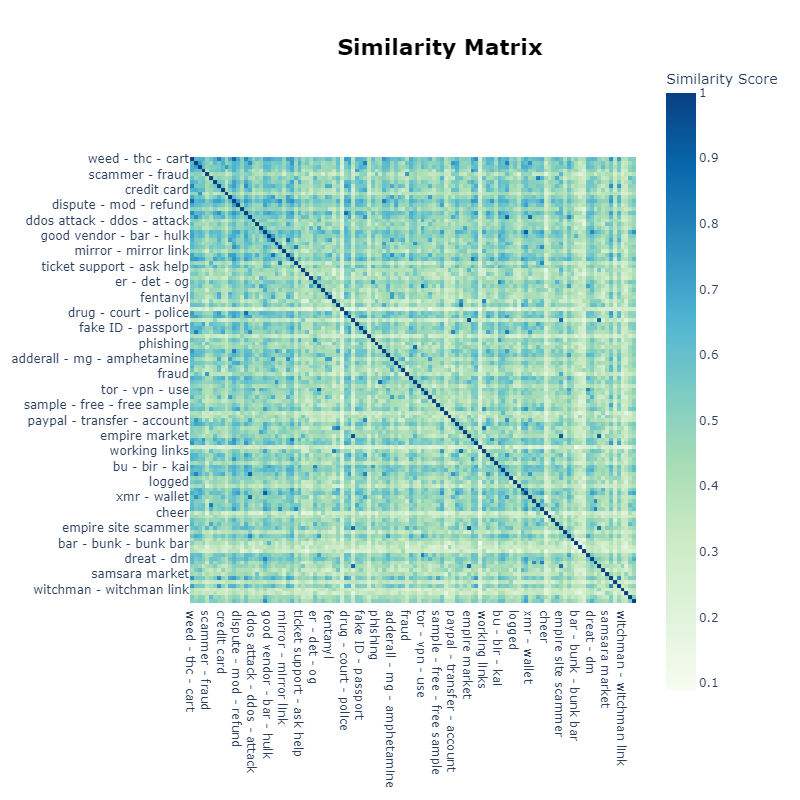

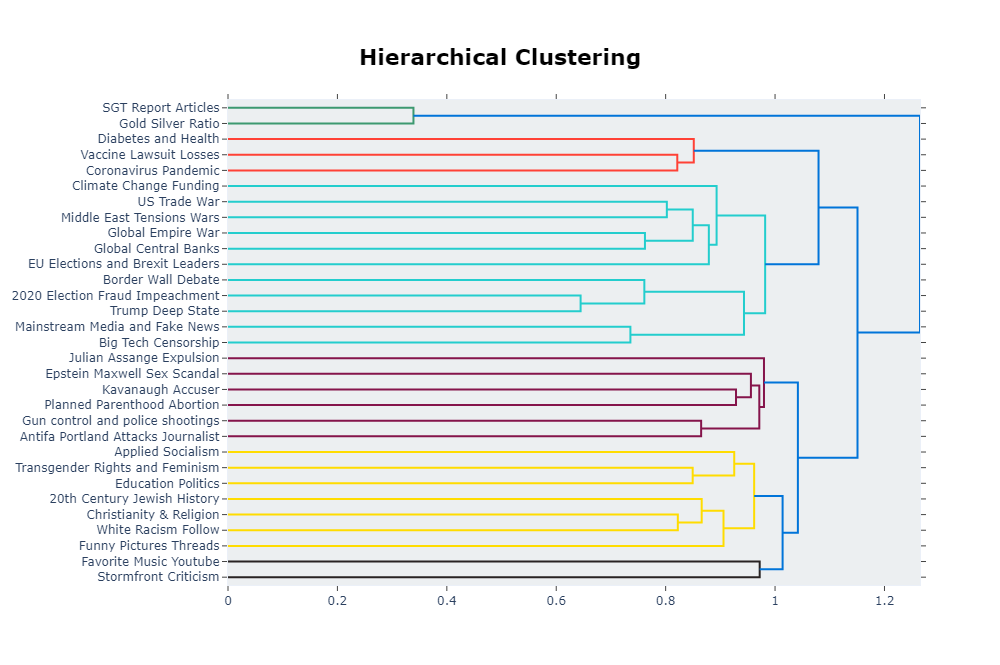
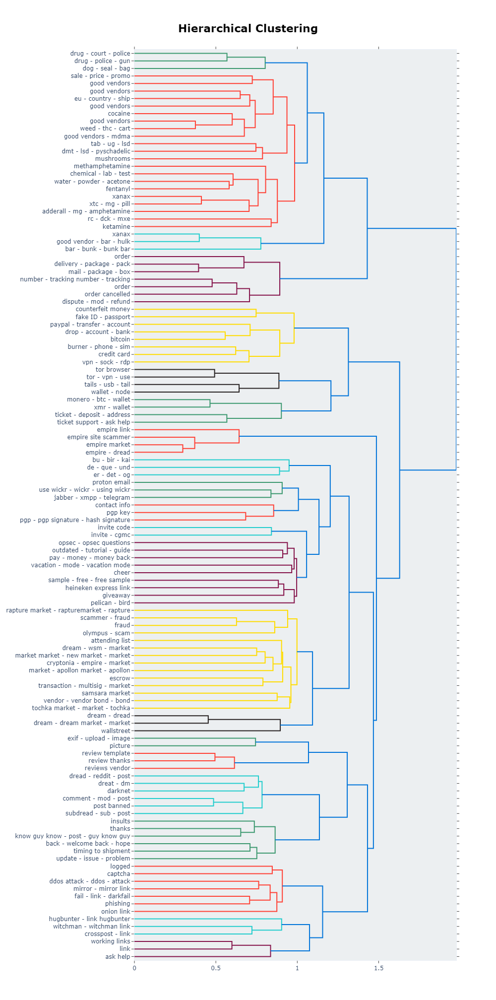

In [27]:
topic_model.visualize_barchart(top_n_topics=31, custom_labels=True, n_words=10, width=350, height=350)

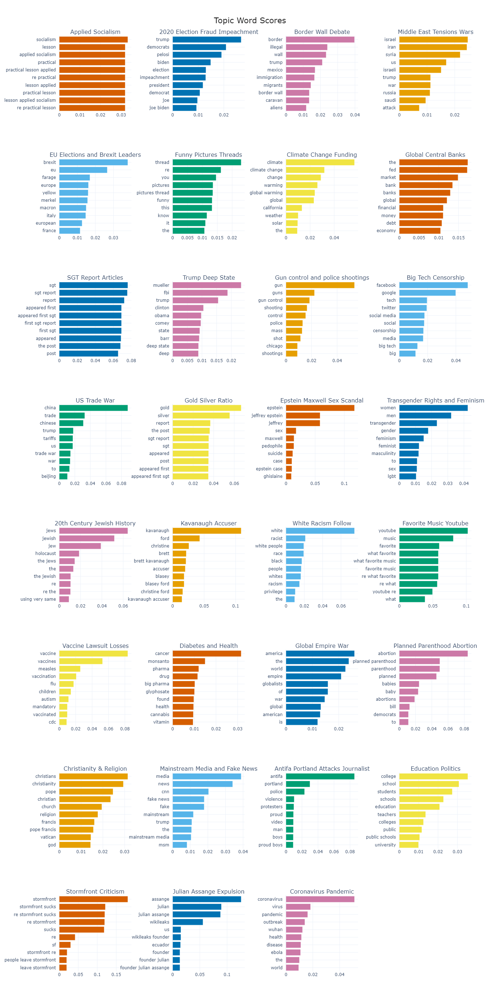
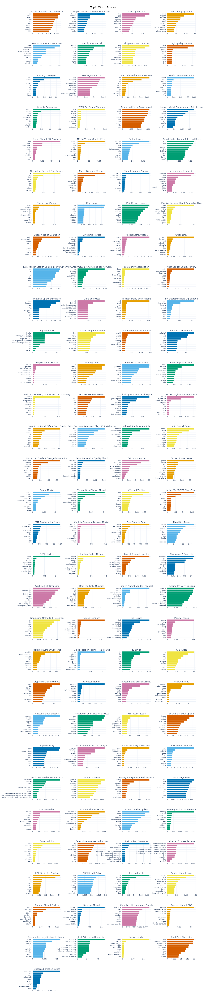

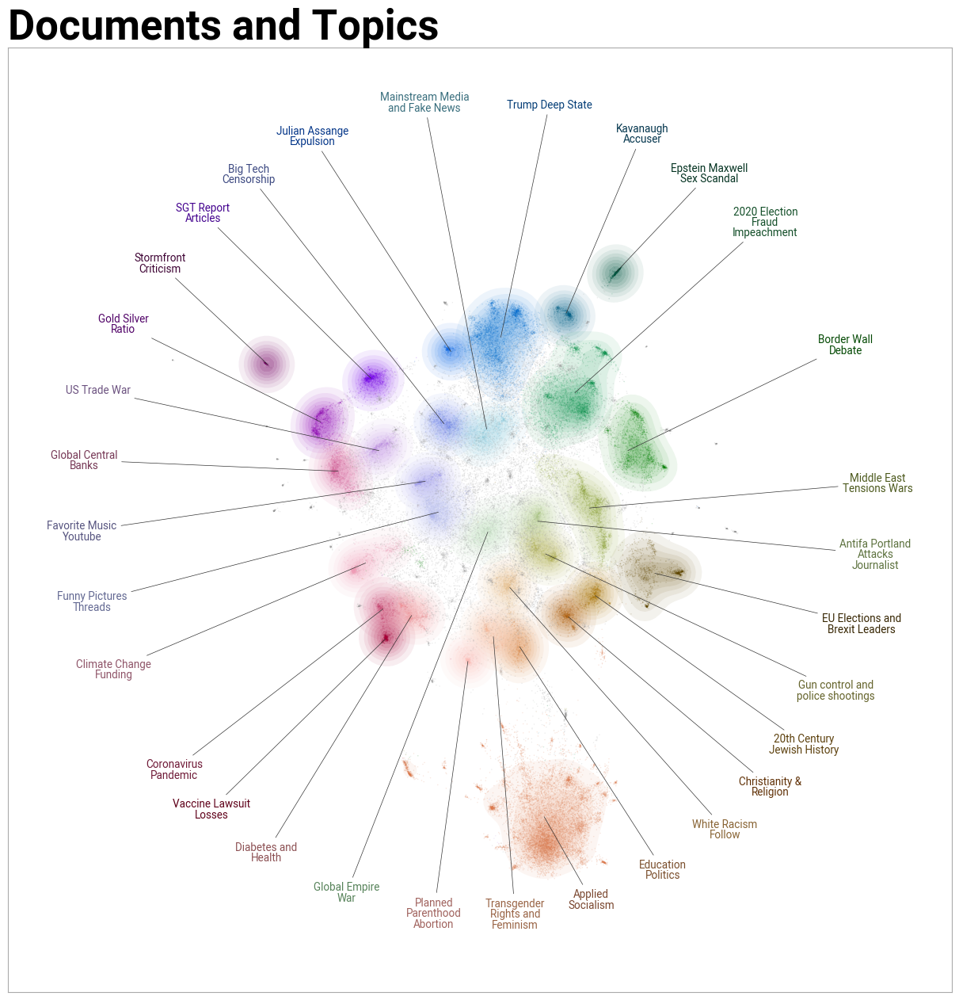

In [30]:
topic_model.visualize_topics_over_time(pd.read_csv('CSV31TopicWhiteNation/topic_over_time_20.csv'), top_n_topics=15, width=1250, height=700, custom_labels=True)

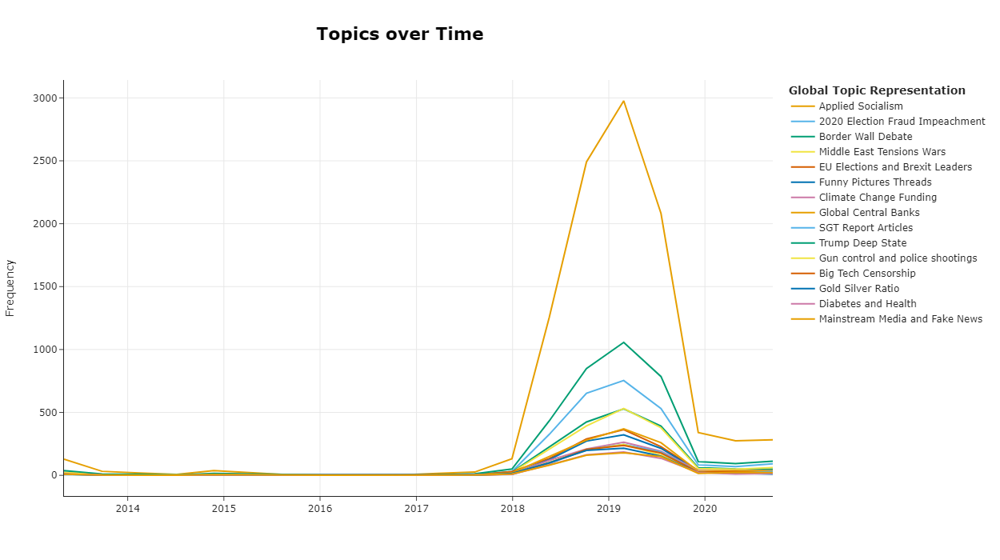
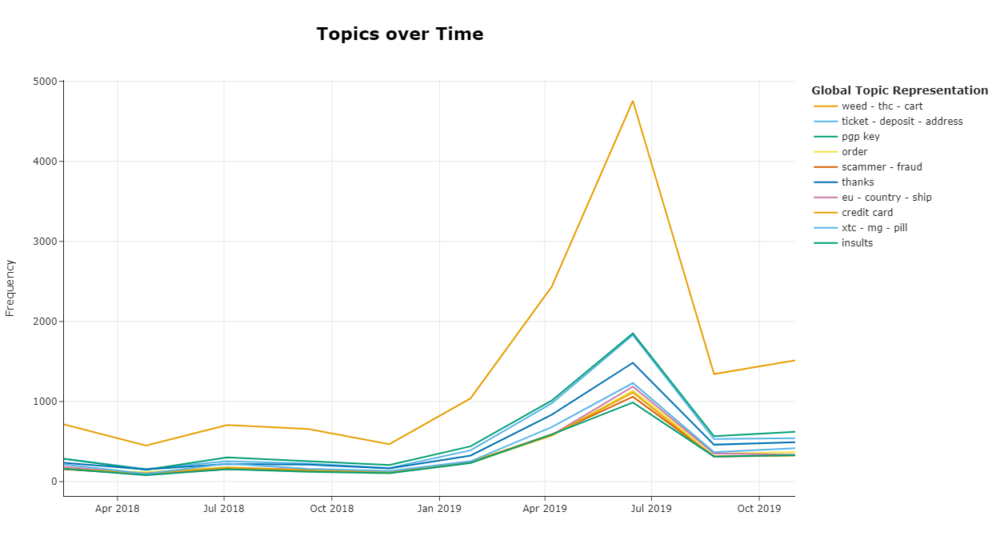
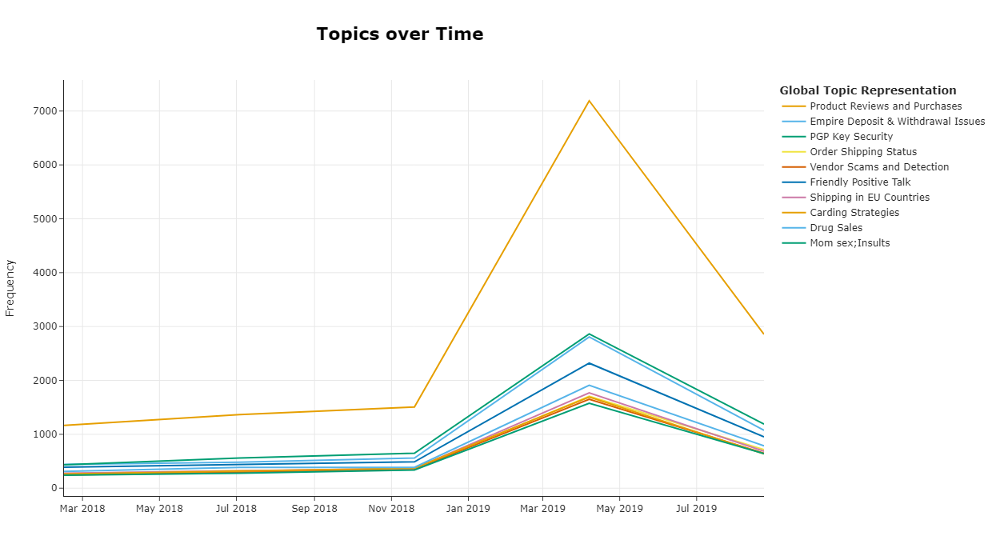
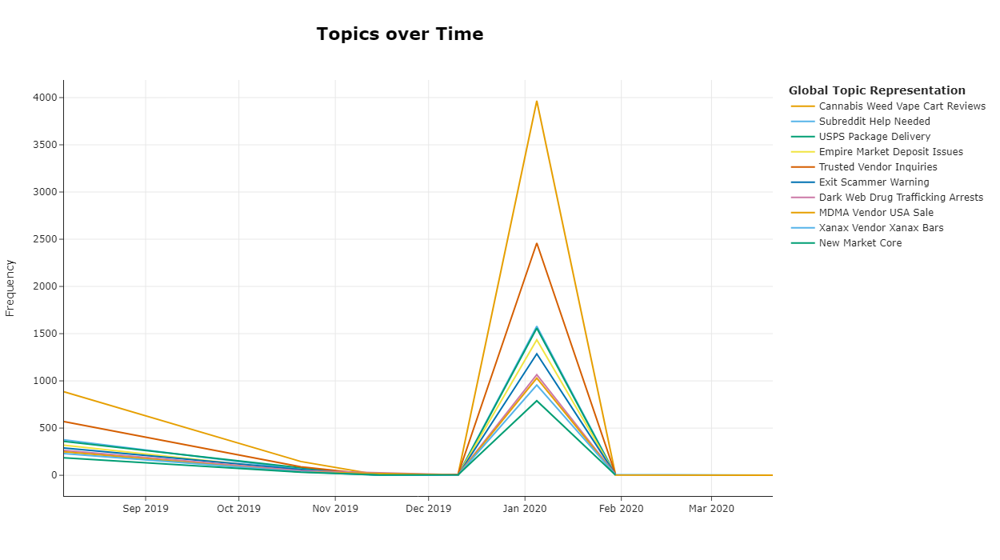

# Predict Models - Usage

In [2]:
topic_model = BERTopic.load("../../Analyze_files/CombiningAnalysisCompleteDataset/ContentAnalysis/ModelsContent/topic_model_all-MiniLM-L6-v2_190_20n_8dim", embedding_model='all-MiniLM-L6-v2')

In [31]:
sentence = ['conspirations']
predict_topic(topic_model, sentence, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(climate, 0.05677249688199357), (climate chan...",1.750655e-01,Climate Change Funding,"[climate, climate change, change, warming, glo...",conspirations
1,"[(america, 0.025957861855601342), (the, 0.0238...",1.255862e-31,Global Empire War,"[america, the, world, empire, globalists, of, ...",conspirations
2,"[(border, 0.03971644636967441), (illegal, 0.02...",1.772883e-36,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",conspirations
3,"[(abortion, 0.0843202302606633), (planned pare...",6.486559e-44,Planned Parenthood Abortion,"[abortion, planned parenthood, parenthood, pla...",conspirations
4,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",8.058954e-48,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",conspirations


In [33]:
predict_topic(topic_model, ['pandemic'], custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  8.79it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(coronavirus, 0.05107391686287775), (virus, 0...",1.0,Coronavirus Pandemic,"[coronavirus, virus, pandemic, outbreak, wuhan...",pandemic
1,"[(epstein, 0.11743330923356197), (jeffrey epst...",0.0,Epstein Maxwell Sex Scandal,"[epstein, jeffrey epstein, jeffrey, sex, maxwe...",pandemic
2,"[(trump, 0.026758981045864254), (democrats, 0....",0.0,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",pandemic
3,"[(border, 0.03971644636967441), (illegal, 0.02...",0.0,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",pandemic
4,"[(israel, 0.024715953727969902), (iran, 0.0243...",0.0,Middle East Tensions Wars,"[israel, iran, syria, us, israeli, trump, war,...",pandemic


In [34]:
predict_topic(topic_model, ['mexican'], custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(border, 0.03971644636967441), (illegal, 0.02...",1.0,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",mexican
1,"[(coronavirus, 0.05107391686287775), (virus, 0...",0.0,Coronavirus Pandemic,"[coronavirus, virus, pandemic, outbreak, wuhan...",mexican
2,"[(epstein, 0.11743330923356197), (jeffrey epst...",0.0,Epstein Maxwell Sex Scandal,"[epstein, jeffrey epstein, jeffrey, sex, maxwe...",mexican
3,"[(trump, 0.026758981045864254), (democrats, 0....",0.0,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",mexican
4,"[(israel, 0.024715953727969902), (iran, 0.0243...",0.0,Middle East Tensions Wars,"[israel, iran, syria, us, israeli, trump, war,...",mexican


In [35]:
predict_topic(topic_model, ['isis'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 25.67it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(america, 0.025957861855601342), (the, 0.0238...",8.517985e-01,Global Empire War,"[america, the, world, empire, globalists, of, ...",isis
1,"[(border, 0.03971644636967441), (illegal, 0.02...",4.472387e-14,Border Wall Debate,"[border, illegal, wall, trump, mexico, immigra...",isis
2,"[(abortion, 0.0843202302606633), (planned pare...",1.626586e-28,Planned Parenthood Abortion,"[abortion, planned parenthood, parenthood, pla...",isis


In [36]:
predict_topic(topic_model, ['journalism'], num_classes=1, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(media, 0.03890151018784896), (news, 0.034068...",1.0,Mainstream Media and Fake News,"[media, news, cnn, fake news, fake, mainstream...",journalism


In [37]:
predict_topic(topic_model, ['America and Europe elections'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 41.68it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(brexit, 0.03797234101764251), (eu, 0.0265756...",0.056397,EU Elections and Brexit Leaders,"[brexit, eu, farage, europe, yellow, merkel, m...",America and Europe elections
1,"[(trump, 0.026758981045864254), (democrats, 0....",0.018783,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",America and Europe elections
2,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.016867,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",America and Europe elections


In [39]:
predict_topic(topic_model, ['i want to buy some guns'], num_classes=2, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(gun, 0.05355233111955208), (guns, 0.02225620...",0.512600,Gun control and police shootings,"[gun, guns, gun control, shooting, control, po...",i want to buy some guns
1,"[(antifa, 0.08558154706448108), (portland, 0.0...",0.012253,Antifa Portland Attacks Journalist,"[antifa, portland, police, violence, protester...",i want to buy some guns


In [40]:
predict_topic(topic_model, ['big tech social engineering'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 17.12it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(facebook, 0.04841142554597407), (google, 0.0...",0.325713,Big Tech Censorship,"[facebook, google, tech, twitter, social media...",big tech social engineering
1,"[(media, 0.03890151018784896), (news, 0.034068...",0.264658,Mainstream Media and Fake News,"[media, news, cnn, fake news, fake, mainstream...",big tech social engineering
2,"[(trump, 0.026758981045864254), (democrats, 0....",0.100338,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",big tech social engineering


In [41]:
predict_topic(topic_model, ['fraud'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 31.13it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(trump, 0.026758981045864254), (democrats, 0....",0.005419,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",fraud
1,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.004945,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",fraud
2,"[(media, 0.03890151018784896), (news, 0.034068...",0.003131,Mainstream Media and Fake News,"[media, news, cnn, fake news, fake, mainstream...",fraud


In [42]:
predict_topic(topic_model, ['deep state'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.216693,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",deep state
1,"[(assange, 0.1258236681252748), (julian, 0.089...",0.094329,Julian Assange Expulsion,"[assange, julian, julian assange, wikileaks, u...",deep state
2,"[(israel, 0.024715953727969902), (iran, 0.0243...",0.088757,Middle East Tensions Wars,"[israel, iran, syria, us, israeli, trump, war,...",deep state


In [43]:
predict_topic(topic_model, ['racism'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 28.57it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(white, 0.07472315534093334), (racist, 0.0211...",0.327285,White Racism Follow,"[white, racist, white people, race, black, peo...",racism
1,"[(college, 0.03536033687772518), (school, 0.03...",0.093827,Education Politics,"[college, school, students, schools, education...",racism
2,"[(women, 0.04240462505747959), (men, 0.0321306...",0.027842,Transgender Rights and Feminism,"[women, men, transgender, gender, feminism, fe...",racism


In [44]:
predict_topic(topic_model, ['Siria War'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 17.18it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(china, 0.0881123141479972), (trade, 0.032705...",0.087425,US Trade War,"[china, trade, chinese, trump, tariffs, us, tr...",Siria War
1,"[(the, 0.017359775297291866), (fed, 0.01721437...",0.079992,Global Central Banks,"[the, fed, market, bank, banks, global, financ...",Siria War
2,"[(sgt, 0.07615796533621144), (sgt report, 0.07...",0.074282,SGT Report Articles,"[sgt, sgt report, report, appeared first, appe...",Siria War


In [48]:
predict_topic(topic_model, ['polluted air'], num_classes=5, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 43.47it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(climate, 0.05677249688199357), (climate chan...",0.023590,Climate Change Funding,"[climate, climate change, change, warming, glo...",polluted air
1,"[(trump, 0.026758981045864254), (democrats, 0....",0.011473,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",polluted air
2,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.010811,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",polluted air
3,"[(america, 0.025957861855601342), (the, 0.0238...",0.009157,Global Empire War,"[america, the, world, empire, globalists, of, ...",polluted air
4,"[(cancer, 0.03159398658567746), (monsanto, 0.0...",0.008769,Diabetes and Health,"[cancer, monsanto, pharma, drug, big pharma, g...",polluted air


In [49]:
predict_topic(topic_model, ['disease'], num_classes=5, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 43.22it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(coronavirus, 0.05107391686287775), (virus, 0...",0.164696,Coronavirus Pandemic,"[coronavirus, virus, pandemic, outbreak, wuhan...",disease
1,"[(cancer, 0.03159398658567746), (monsanto, 0.0...",0.164014,Diabetes and Health,"[cancer, monsanto, pharma, drug, big pharma, g...",disease
2,"[(vaccine, 0.08350704983191475), (vaccines, 0....",0.130836,Vaccine Lawsuit Losses,"[vaccine, vaccines, measles, vaccination, flu,...",disease
3,"[(trump, 0.026758981045864254), (democrats, 0....",0.003435,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",disease
4,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.003325,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",disease


In [54]:
predict_topic(topic_model, ['what do you think of trump?'], num_classes=5, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


,Topic,Probability,Label,Words,Sentence
0,"[(trump, 0.026758981045864254), (democrats, 0....",0.422012,2020 Election Fraud Impeachment,"[trump, democrats, pelosi, biden, election, im...",what do you think of trump?
1,"[(media, 0.03890151018784896), (news, 0.034068...",0.174217,Mainstream Media and Fake News,"[media, news, cnn, fake news, fake, mainstream...",what do you think of trump?
2,"[(facebook, 0.04841142554597407), (google, 0.0...",0.129109,Big Tech Censorship,"[facebook, google, tech, twitter, social media...",what do you think of trump?
3,"[(mueller, 0.023352476102044262), (fbi, 0.0187...",0.022607,Trump Deep State,"[mueller, fbi, trump, clinton, obama, comey, s...",what do you think of trump?
4,"[(israel, 0.024715953727969902), (iran, 0.0243...",0.010960,Middle East Tensions Wars,"[israel, iran, syria, us, israeli, trump, war,...",what do you think of trump?


# Hugging Face

In [ ]:
topic_model.push_to_hf_hub(
    repo_id="D0men1c0/ISSR_Dark_Web_31Topics_White_Nation",
    save_embedding_model='all-MiniLM-L6-v2',
    save_ctfidf=True
)

In [56]:
topic_model = BERTopic.load('D0men1c0/ISSR_Dark_Web_31Topics_White_Nation')

In [58]:
sentence = ['climate']
topic, _ = topic_model.transform(sentence)
topic_model.get_topic_info(topic[0])

Batches: 100%|██████████| 1/1 [00:00<00:00, 14.61it/s]
2024-08-03 21:28:02,131 - BERTopic - Predicting topic assignments through cosine similarity of topic and document embeddings.


,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,6,915,6_climate_climate change_change_warming,Climate Change Funding,"[climate, climate change, change, warming, glo...",NaN
